Dataset already exists at /Users/sofiansyed/.convokit/saved-corpora/gap-corpus
Download complete


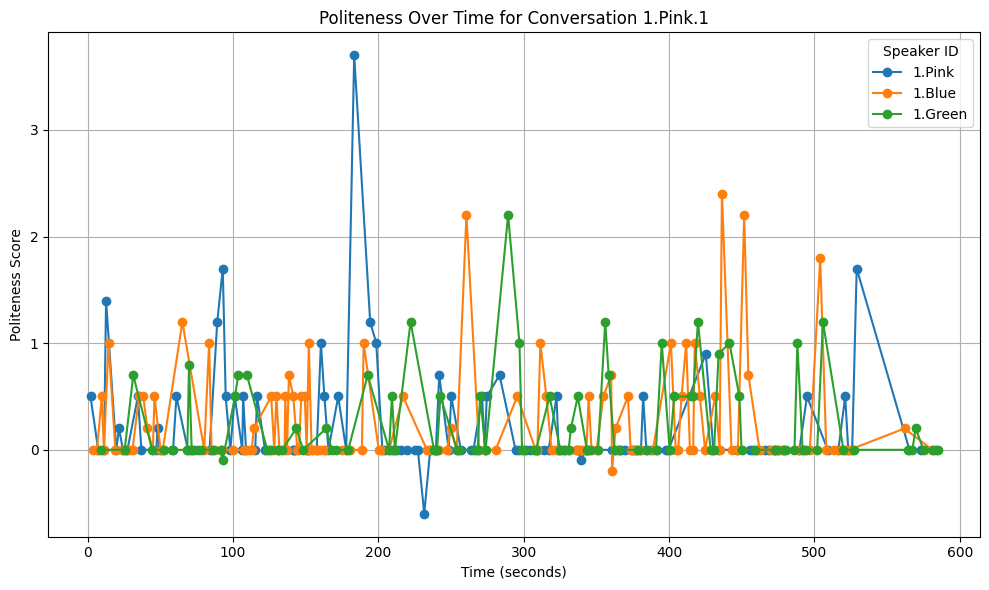

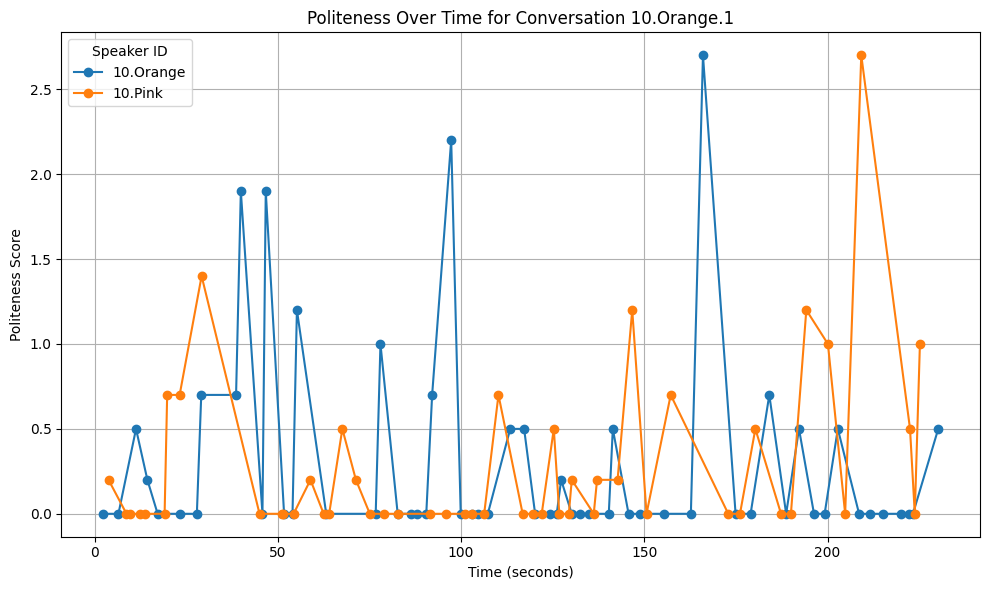

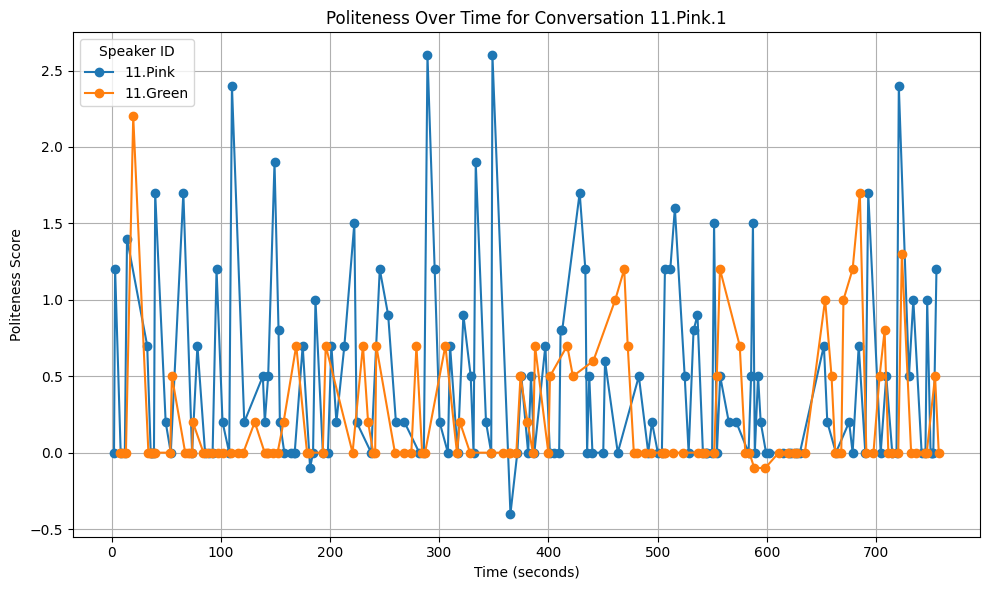

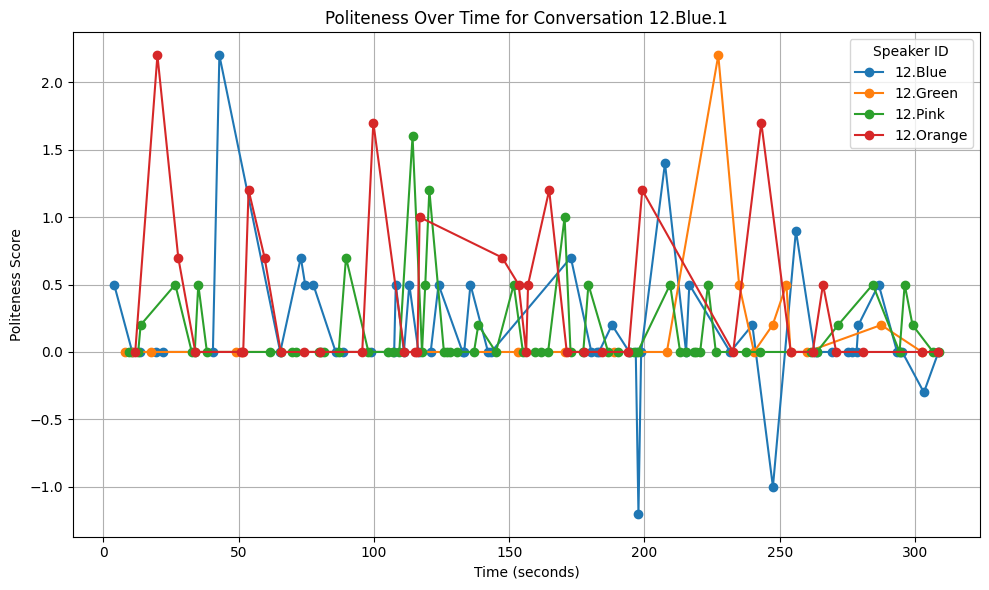

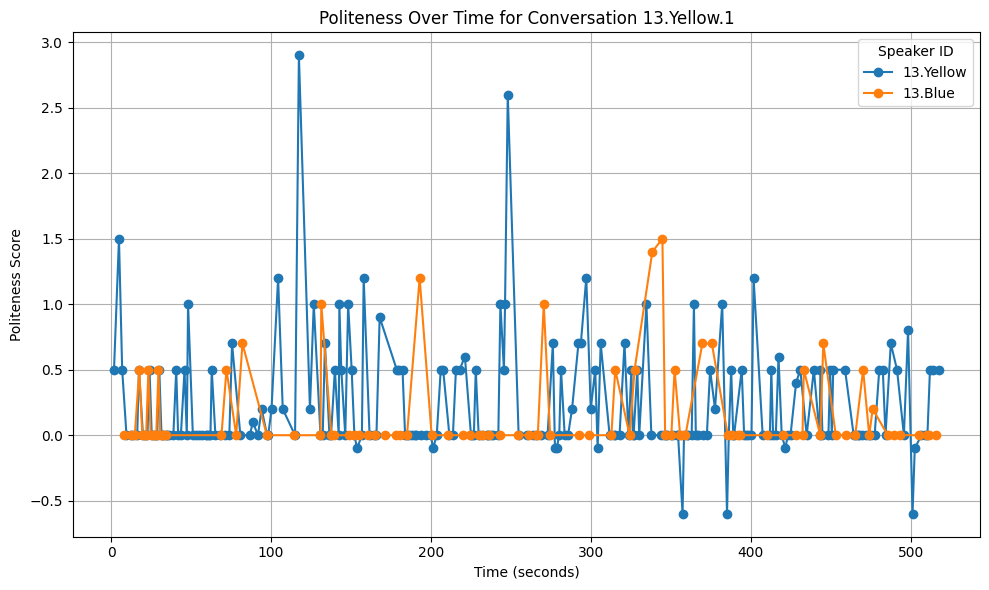

...

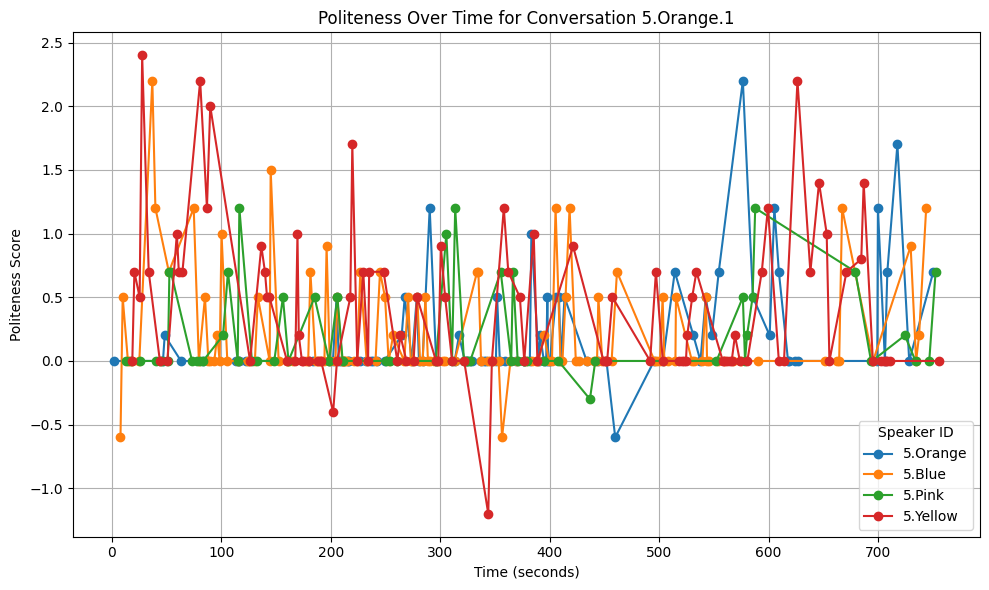

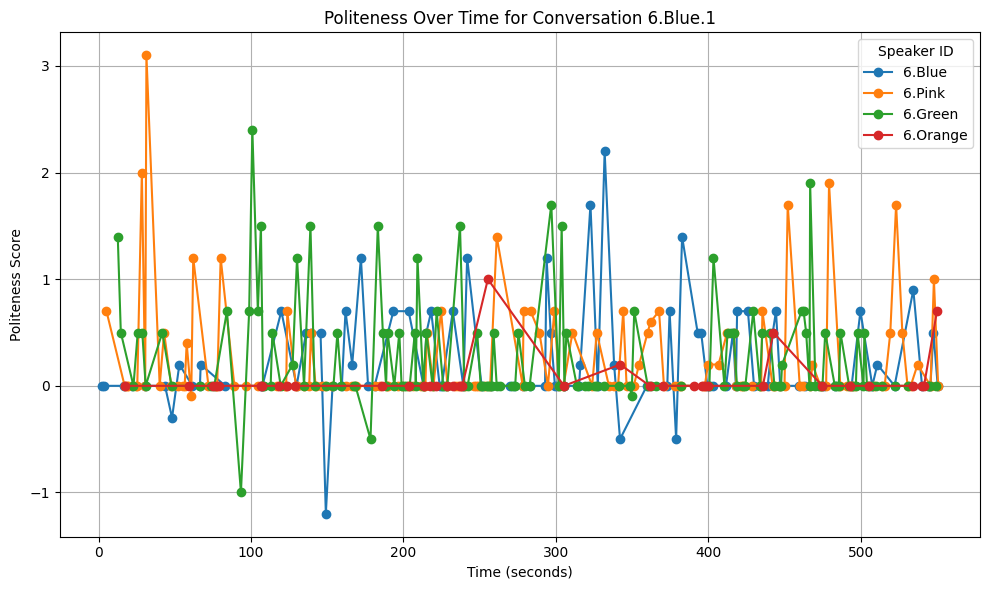

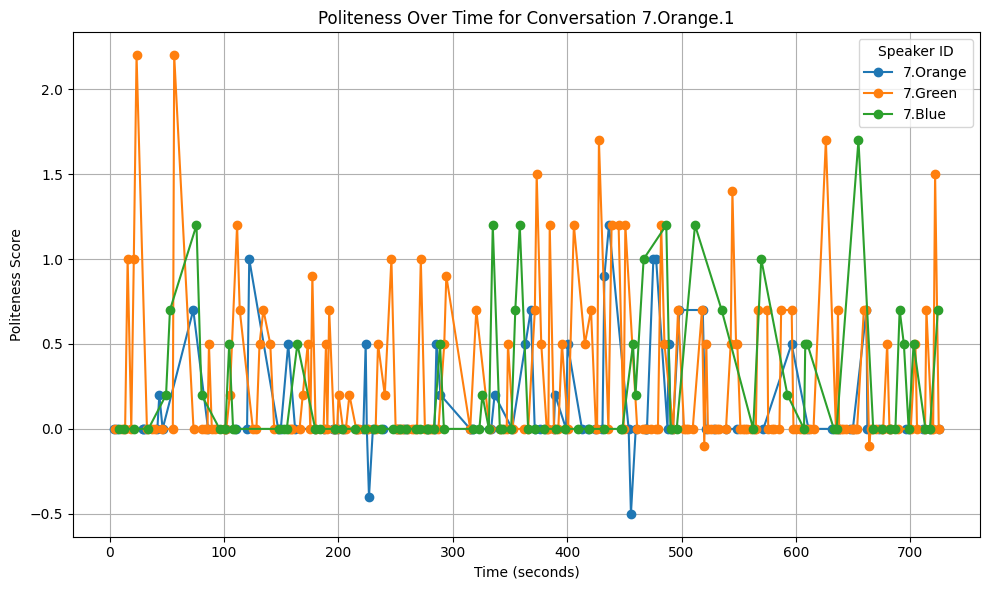

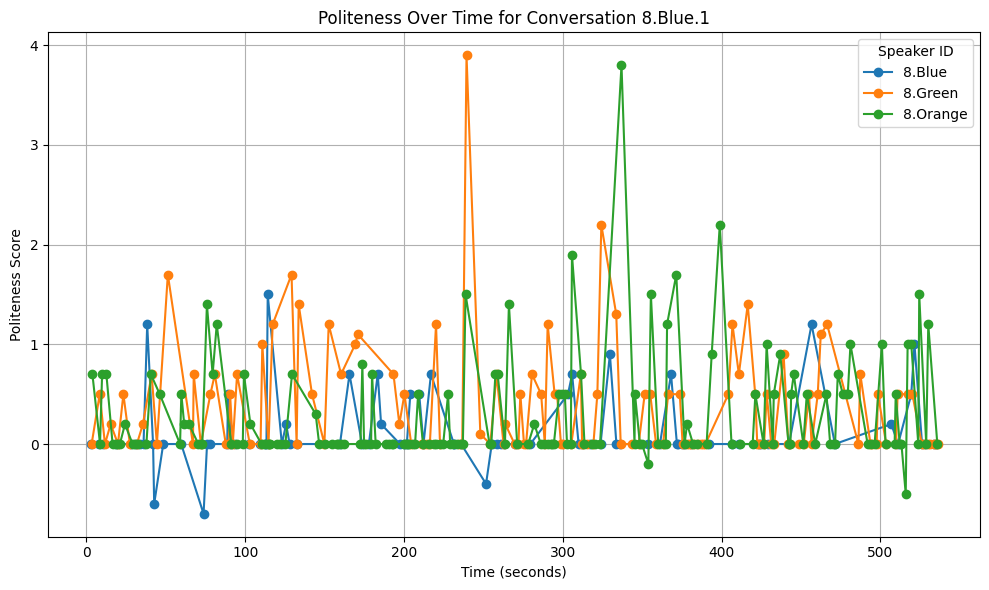

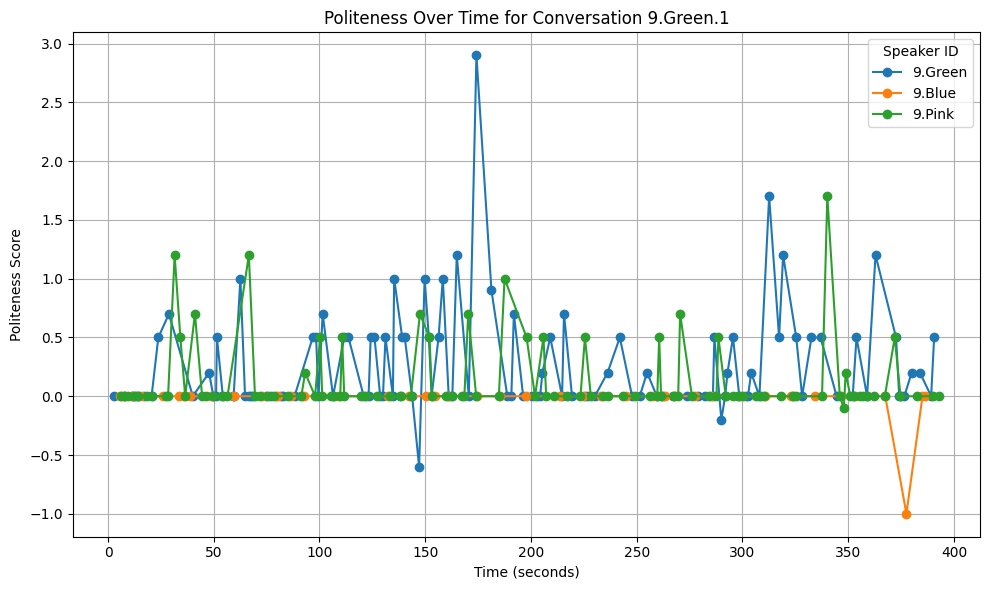

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
from convokit import Corpus, download

# Defines keywords for politeness and impoliteness with custom weights.
# Iterates over each utterance in each conversation, calculates a politeness score, and plots how that score evolves over time per speaker.
gap_corpus = Corpus(filename=download("gap-corpus"))
print("Download complete")


politeness_indicators = {
    # Direct politeness markers (strong)
    'please': 2.0, 
    'thank you': 2.0,
    'thanks': 1.5,
    'appreciate': 1.5,
    'grateful': 1.5,
    'sorry': 1.5,
    'excuse': 1.5,
    'pardon': 1.5,
    # Hedges and indirect requests (moderate)
    'would you': 1.0,
    'could you': 1.0,
    'may i': 1.0,
    'might': 0.8,
    'perhaps': 0.8,
    'possibly': 0.8,
    'i think': 0.7,
    'i believe': 0.7,
    'wondering': 0.7,
    # Agreement and acknowledgment (moderate)
    'good point': 1.2,
    'good idea': 1.2,
    "you're right": 1.2,
    'true': 0.7,
    'agree': 1.0,
    'makes sense': 1.0,
    'see what you mean': 1.0,
    'understand': 0.7,
    # Collaborative language (subtle)
    'we': 0.5,
    'us': 0.5,
    'our': 0.5,
    'together': 0.7,
    "let's": 0.7,
    "why don't we": 0.8,
    'what if we': 0.8,
    'we could': 0.7,
    # Deference and respect (subtle)
    'everyone': 0.5,
    'your thoughts': 0.8,
    'what do you think': 0.8,
    'opinion': 0.6,
    'feel free': 0.8,
    'up to you': 0.8
}

impoliteness_indicators = {
    # Direct impoliteness (strong)
    'shut up': 2.0,
    'stupid': 2.0,
    'idiot': 2.0,
    'dumb': 1.8,
    'ridiculous': 1.5,
    'nonsense': 1.5,
    'useless': 1.5,
    'waste': 1.5,
    # Dismissal and disagreement (moderate)
    'whatever': 1.2,
    'not true': 1.2,
    'wrong': 1.0,
    'incorrect': 1.0,
    'false': 1.0,
    'bad idea': 1.0,
    'terrible idea': 1.2,
    'not going to work': 1.0,
    # Commanding language (moderate)
    'must': 0.7,
    'have to': 0.7,
    'need to': 0.6,
    'do this': 0.6,
    'do that': 0.6,
    # Interruption and impatience (subtle)
    'anyway': 0.5,
    'moving on': 0.5,
    'get to the point': 0.8,
    'already said': 0.7,
    'already know': 0.7,
    # Dismissive transitions (subtle)
    'but,': 0.4,
    'however,': 0.4,
    'actually,': 0.4,
    'no,': 0.5,
    'not really': 0.6
}

def timestamp_to_seconds(timestamp_str):
    """
    Convert a timestamp in MM:SS.ds format to total seconds.
    Example: "02:10.5" -> 130.5 seconds.
    """
    try:
        minutes, sec_dec = timestamp_str.split(":")
        total_seconds = int(minutes) * 60 + float(sec_dec)
        return total_seconds
    except Exception as e:
        print(f"Error converting timestamp {timestamp_str}: {e}")
        return None

# Iterate through each conversation to compute and plot utterance-level politeness scores
for conv_id, conversation in gap_corpus.conversations.items():
    # Each speaker's (time, politeness score)
    speakers_data = {}
    

    for utterance in conversation.iter_utterances():

        if not utterance.timestamp or not hasattr(utterance, 'text') or not utterance.text:
            continue
        time_sec = timestamp_to_seconds(utterance.timestamp)
        if time_sec is None:
            continue
        
        # Retrieve speaker ID and normalize text
        speaker_id = utterance.speaker.id
        text = utterance.text.lower()
        if text.strip() in ["$", "%", "#"]:
            continue
        
        # Calculate politeness score for this utterance
        utterance_politeness = 0.0
        # Add scores for polite indicators
        for indicator, weight in politeness_indicators.items():
            count = text.count(indicator)
            if count:
                utterance_politeness += count * weight
        # Subtract scores for impolite indicators
        for indicator, weight in impoliteness_indicators.items():
            count = text.count(indicator)
            if count:
                utterance_politeness -= count * weight
        # Include a sentence length factor (if longer than 10 words, add a small bonus)
        words = text.split()
        if len(words) > 10:
            utterance_politeness += 0.2
        

        speakers_data.setdefault(speaker_id, []).append((time_sec, utterance_politeness))
    
    # GPT created plotting
    plt.figure(figsize=(10, 6))
    plt.title(f"Politeness Over Time for Conversation {conv_id}")
    plt.xlabel("Time (seconds)")
    plt.ylabel("Politeness Score")

    for speaker_id, data_points in speakers_data.items():
        data_points.sort(key=lambda x: x[0])
        times, scores = zip(*data_points)
        plt.plot(times, scores, marker='o', label=speaker_id)
    
    plt.legend(title="Speaker ID")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


Dataset already exists at /Users/sofiansyed/.convokit/saved-corpora/gap-corpus
Download complete!


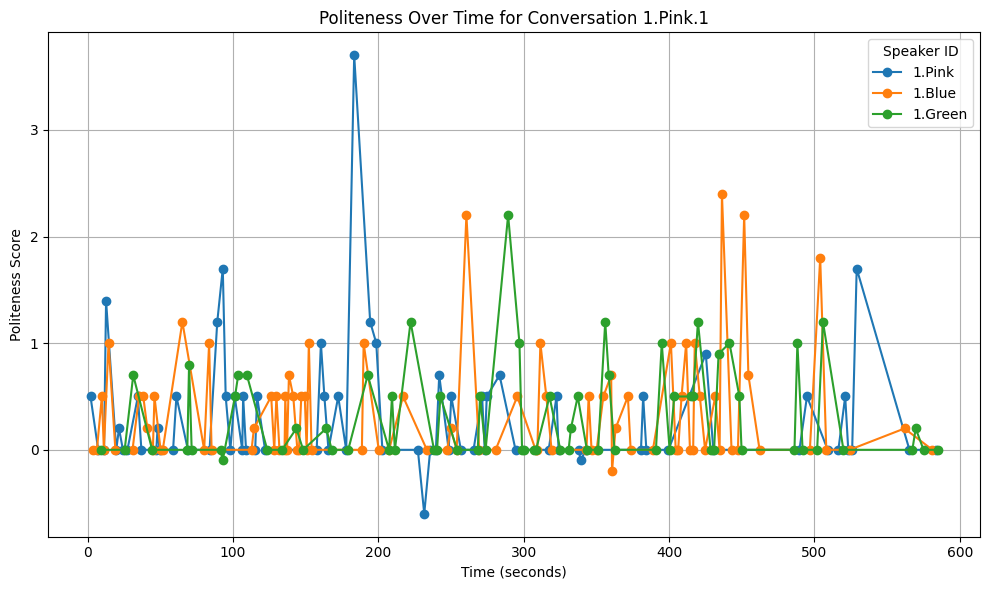

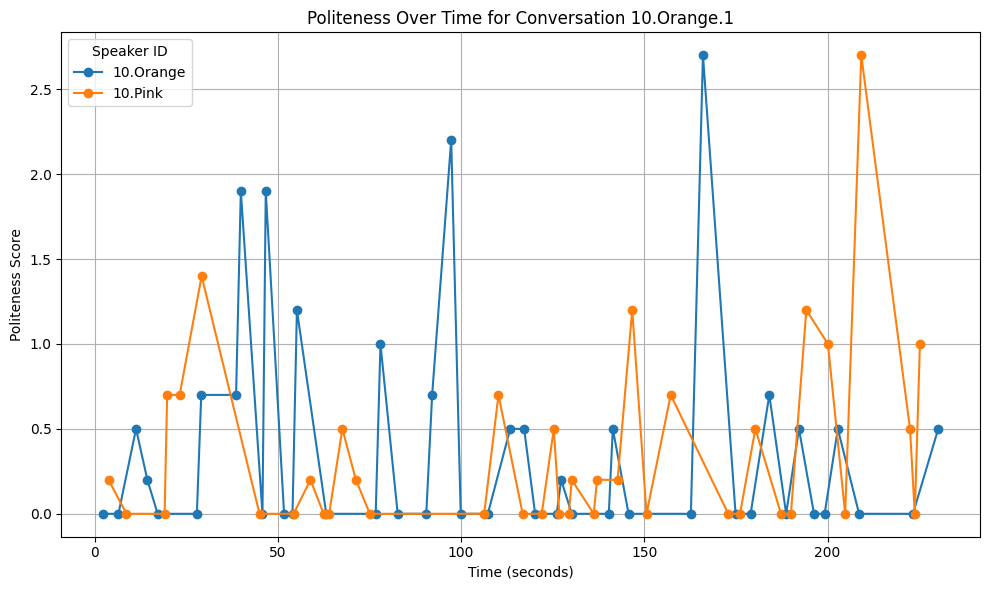

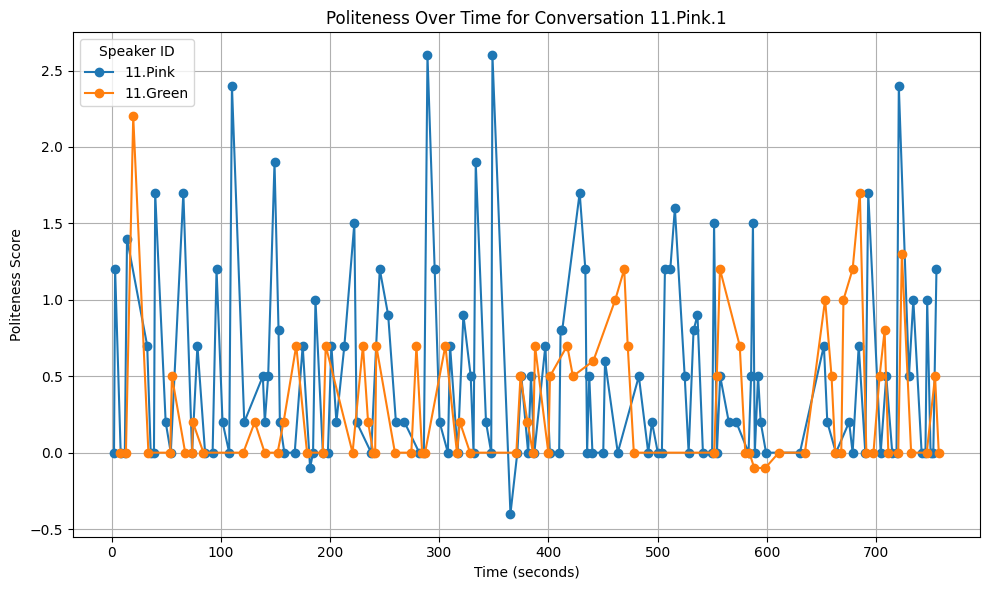

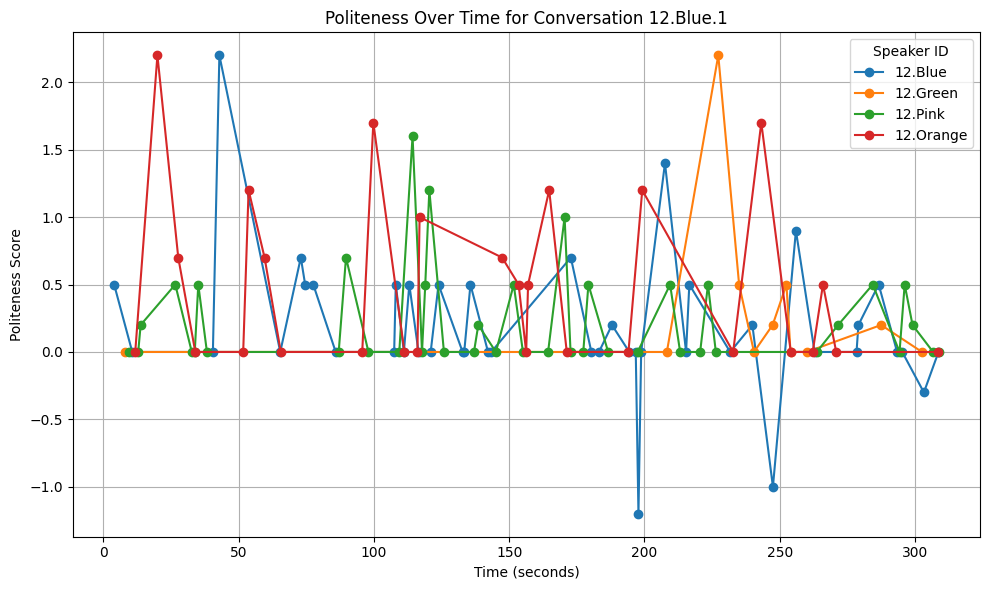

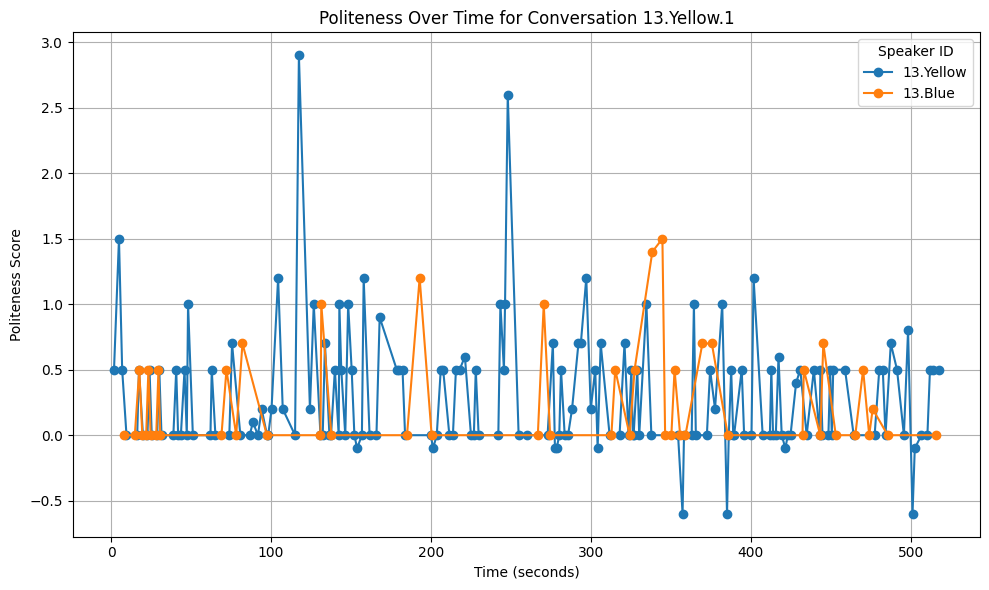

...

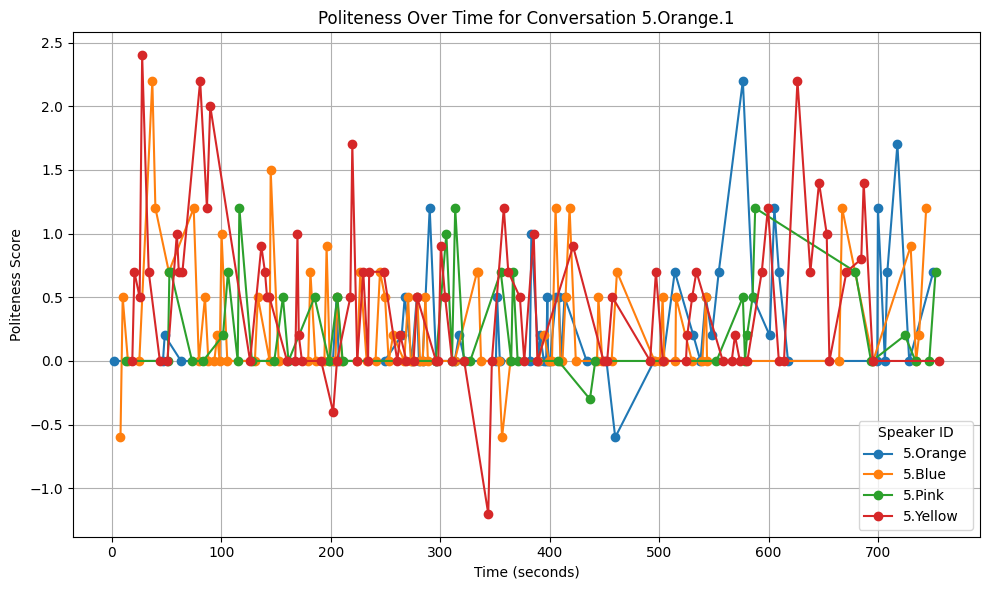

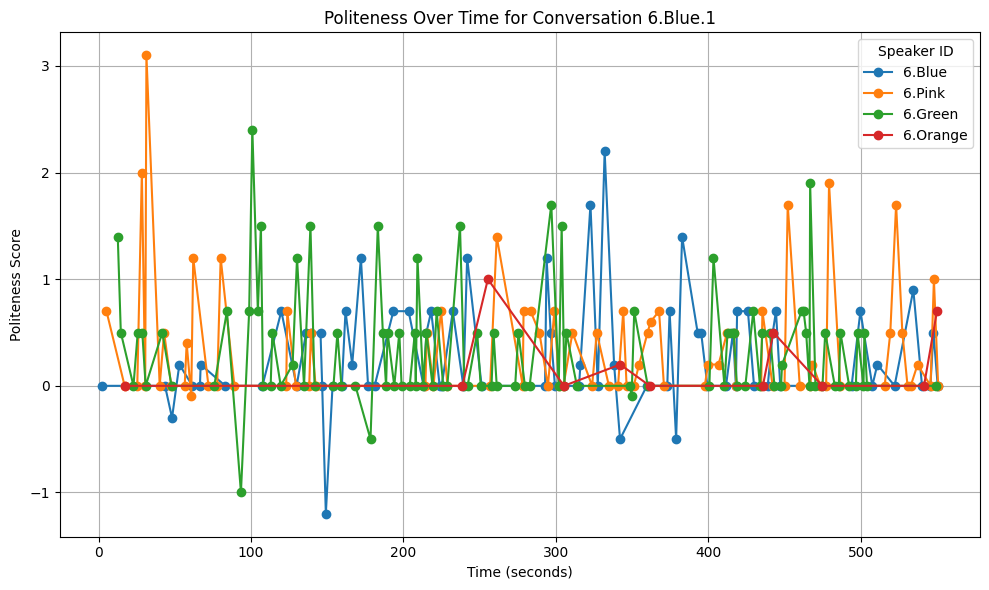

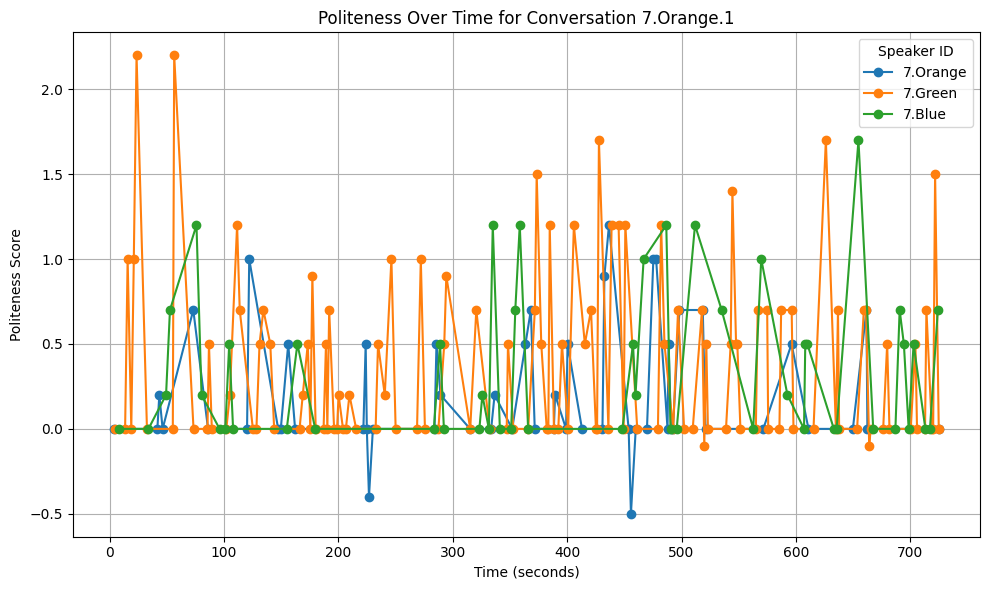

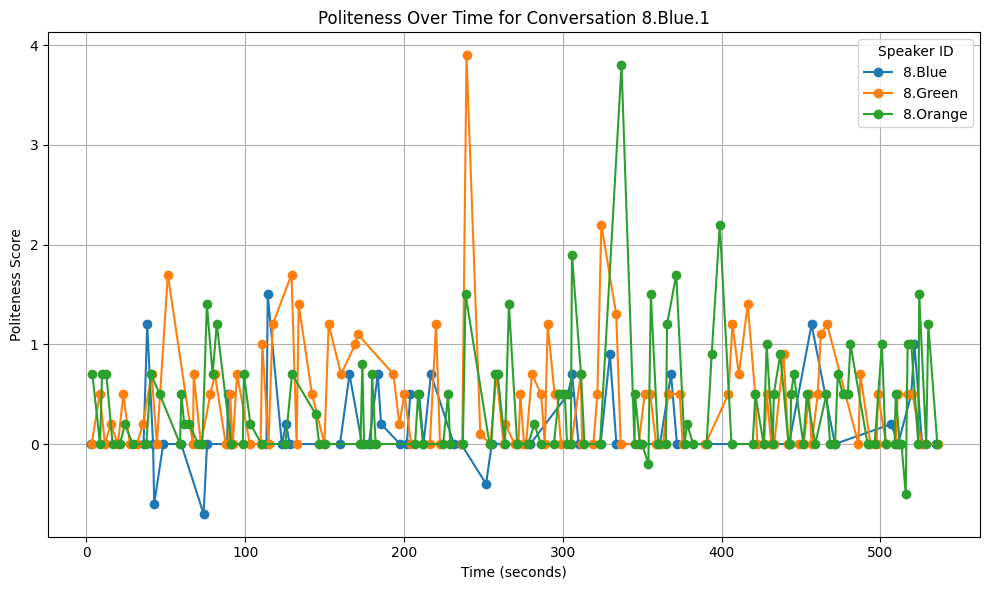

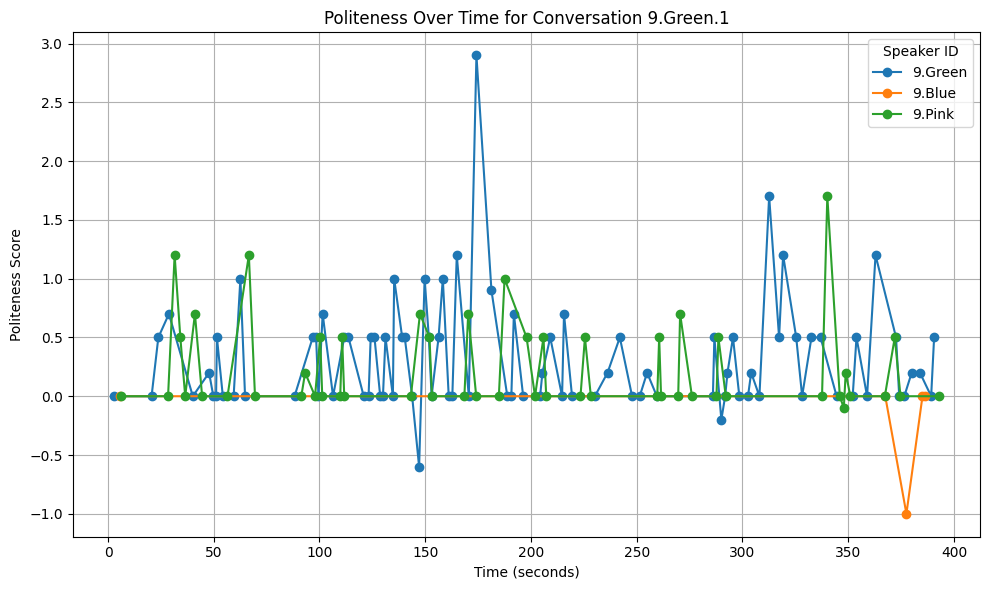

In [2]:
import matplotlib.pyplot as plt
import pandas as pd
from convokit import Corpus, download

# cleans up the plots from previous code block by compressing flat zero-score stretches.

gap_corpus = Corpus(filename=download("gap-corpus"))
print("Download complete!")


def collapse_consecutive_zeros(data_points):
    if not data_points:
        return data_points
    
    cleaned = []
    i = 0
    n = len(data_points)
    while i < n:
        time_val, score = data_points[i]
        if score != 0:
            cleaned.append(data_points[i])
            i += 1
        else:
            # Start of a zero run
            start_point = data_points[i]
            j = i + 1
            while j < n and data_points[j][1] == 0:
                j += 1
            end_point = data_points[j - 1]
            # Add the first zero
            cleaned.append(start_point)
            # If the run has more than one point, add the end point as well.
            if j - i > 1 and end_point[0] != start_point[0]:
                cleaned.append(end_point)
            i = j
    return cleaned

# Iterate through each conversation to compute and plot politeness scores
for conv_id, conversation in gap_corpus.conversations.items():
    speakers_data = {}
    
    # Process each utterance in the conversation
    for utterance in conversation.iter_utterances():

        if not utterance.timestamp or not hasattr(utterance, 'text') or not utterance.text:
            continue
        time_sec = timestamp_to_seconds(utterance.timestamp)
        if time_sec is None:
            continue
        
        speaker_id = utterance.speaker.id
        text = utterance.text.lower()
        
        # Skip non-speech markers
        if text.strip() in ["$", "%", "#"]:
            continue
        
        # Calculate the politeness score for this utterance
        utterance_politeness = 0.0
        for indicator, weight in politeness_indicators.items():
            count = text.count(indicator)
            if count:
                utterance_politeness += count * weight
        for indicator, weight in impoliteness_indicators.items():
            count = text.count(indicator)
            if count:
                utterance_politeness -= count * weight
        # Add a small bonus for longer utterances
        words = text.split()
        if len(words) > 10:
            utterance_politeness += 0.2
        
        speakers_data.setdefault(speaker_id, []).append((time_sec, utterance_politeness))
    
    # GPT Plotting
    plt.figure(figsize=(10, 6))
    plt.title(f"Politeness Over Time for Conversation {conv_id}")
    plt.xlabel("Time (seconds)")
    plt.ylabel("Politeness Score")
    
    # Process and plot data for each speaker
    for speaker_id, data_points in speakers_data.items():
        data_points.sort(key=lambda x: x[0])
        cleaned_points = collapse_consecutive_zeros(data_points)
        times = [pt[0] for pt in cleaned_points]
        scores = [pt[1] for pt in cleaned_points]
        plt.plot(times, scores, marker='o', label=speaker_id)
    
    plt.legend(title="Speaker ID")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


Dataset already exists at /Users/sofiansyed/.convokit/saved-corpora/gap-corpus
Download complete!


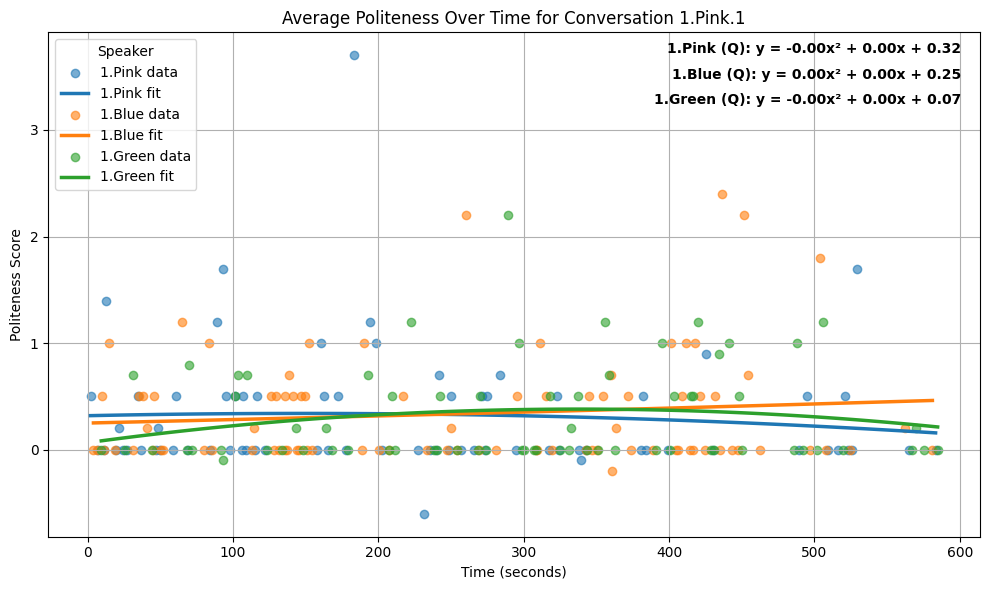

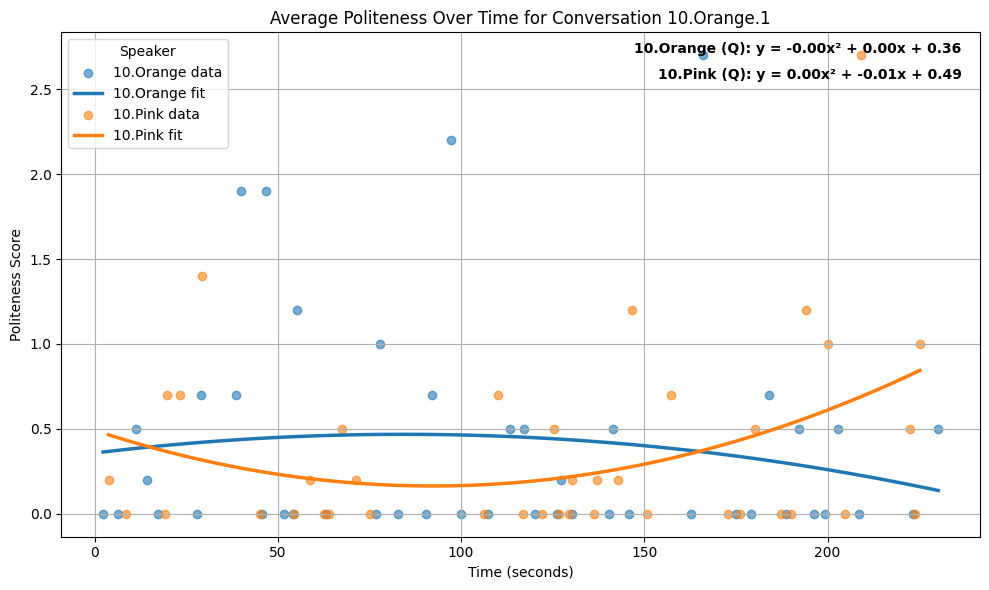

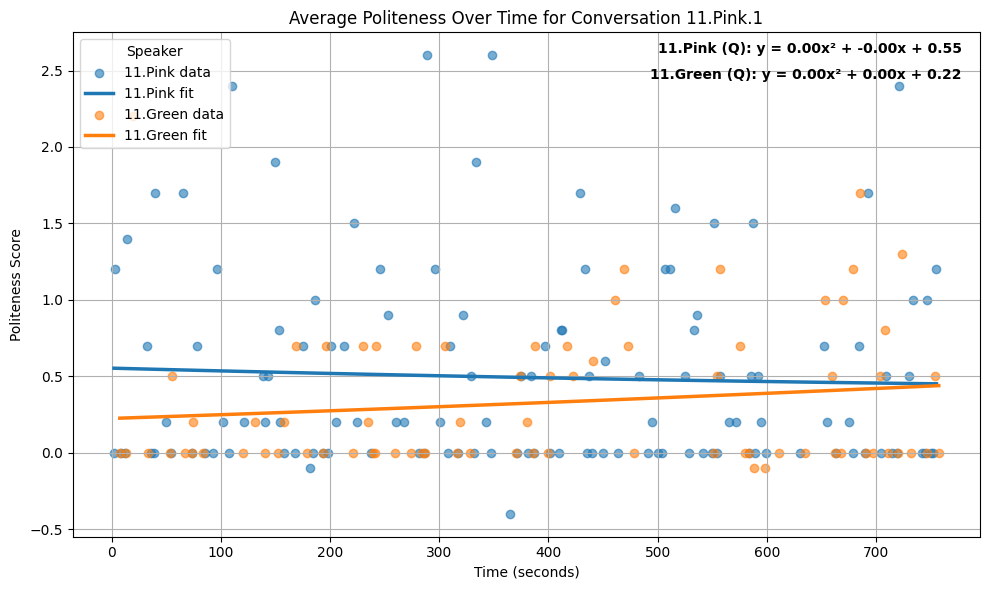

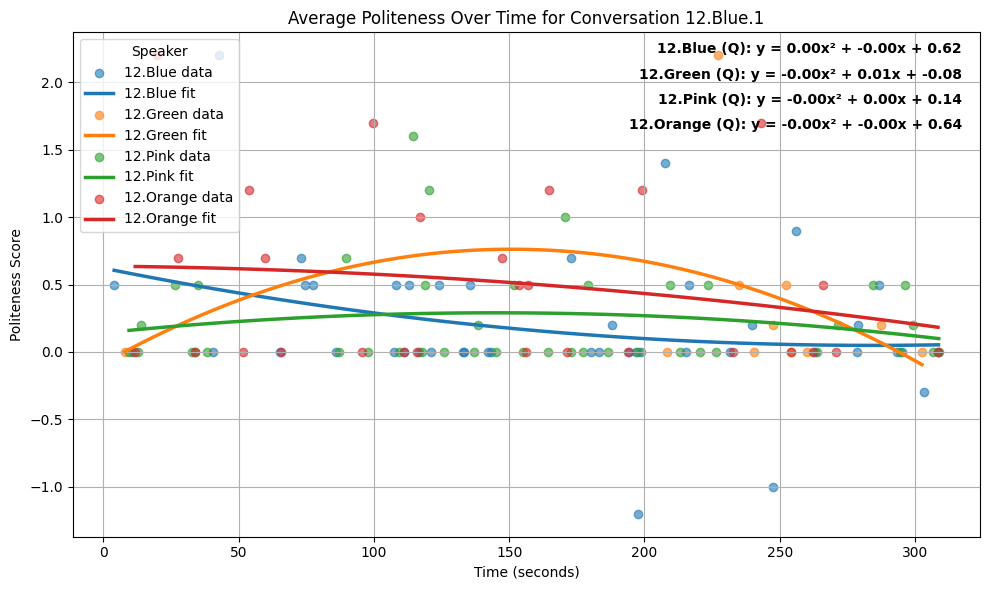

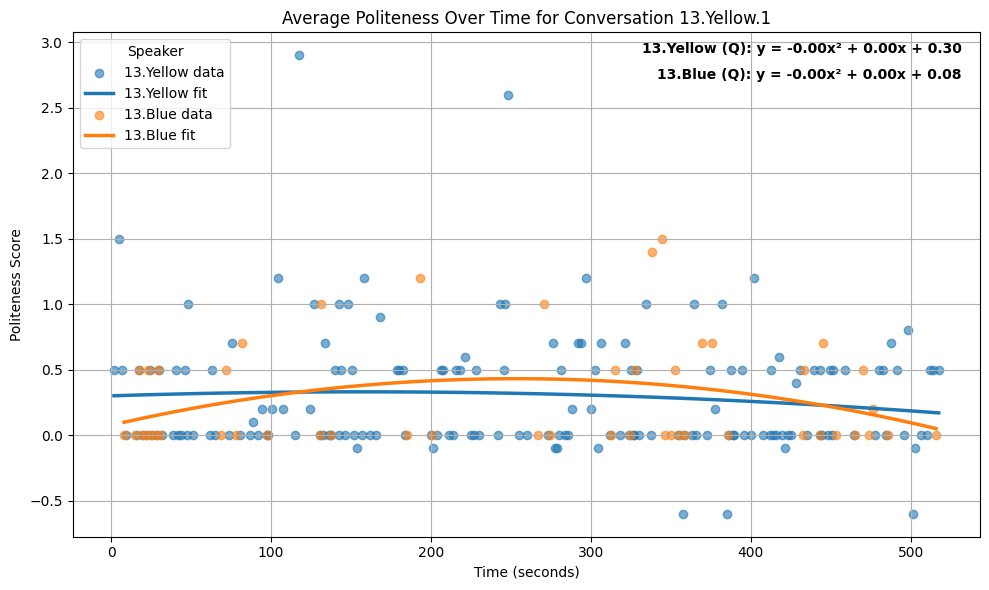

...

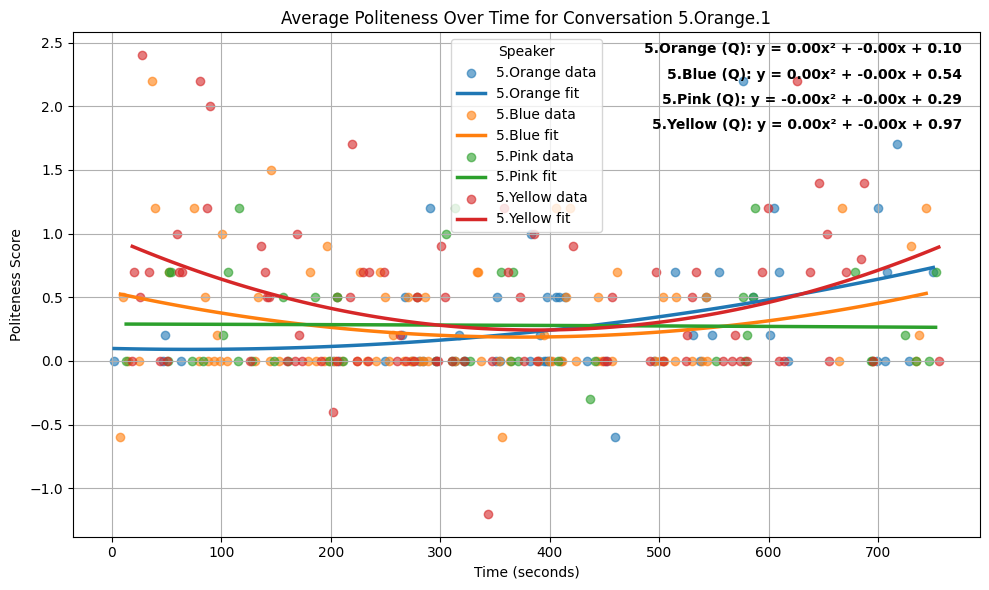

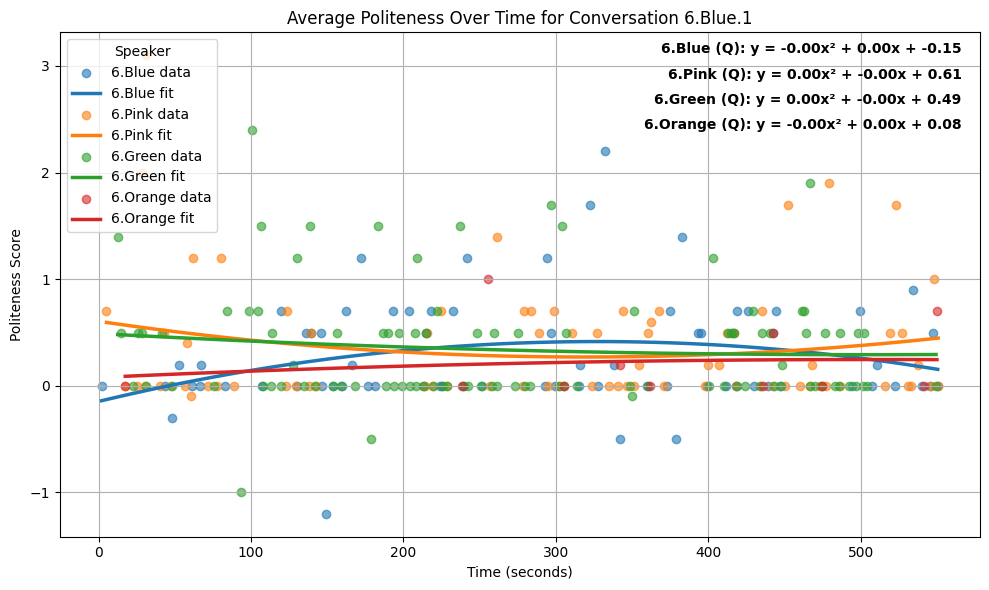

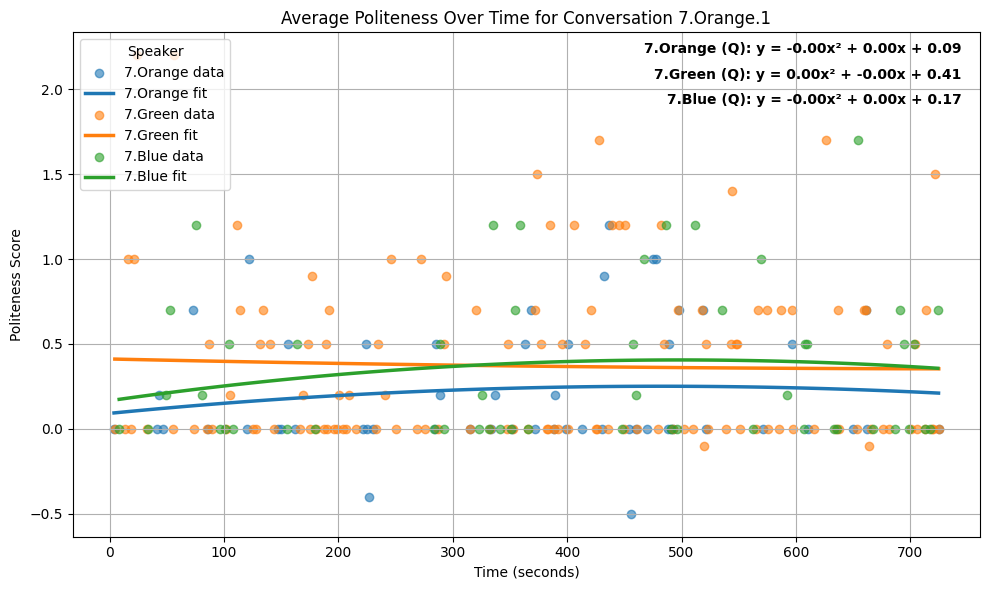

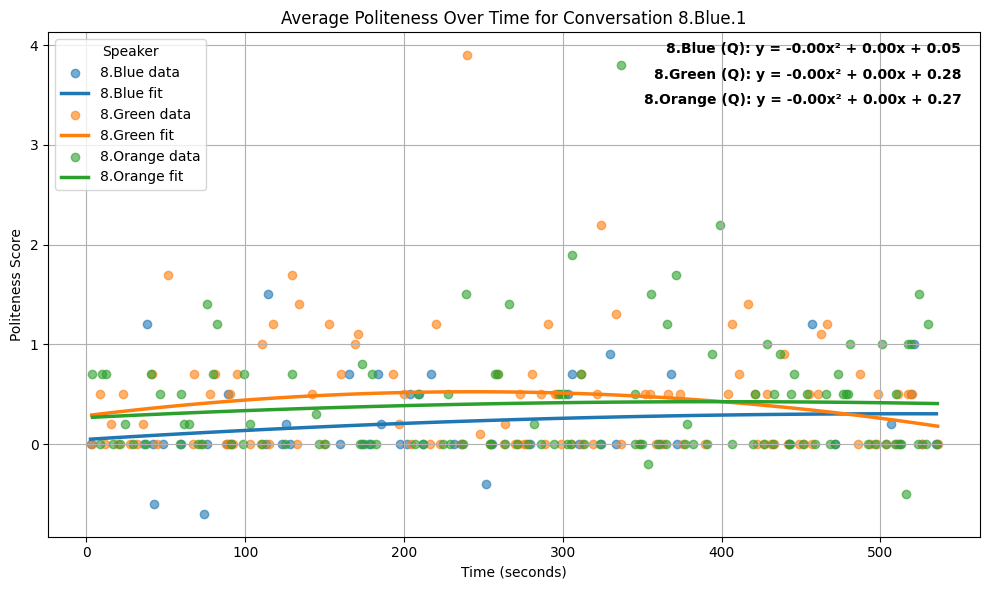

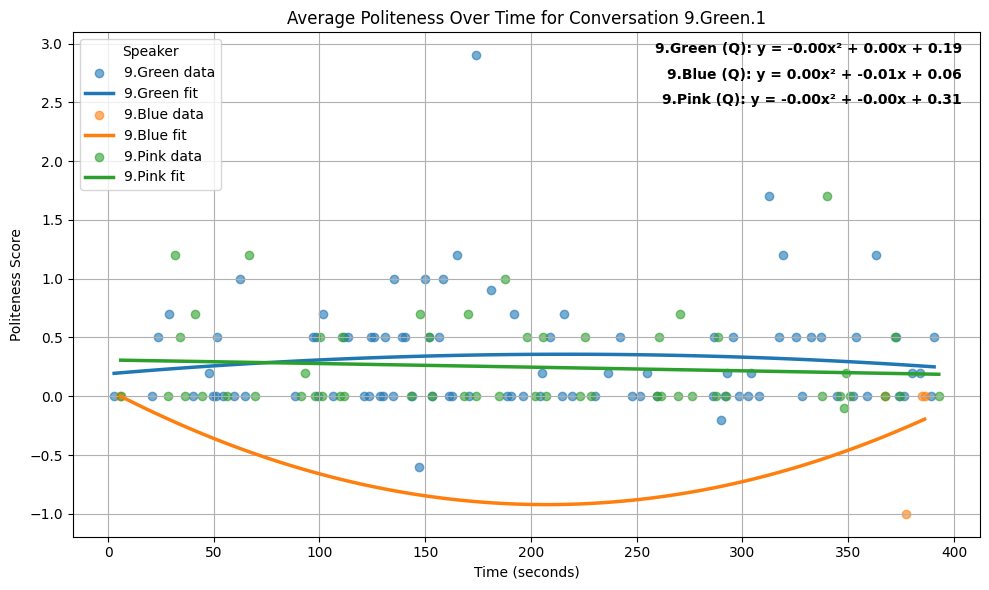

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from convokit import Corpus, download

gap_corpus = Corpus(filename=download("gap-corpus"))
print("Download complete!")

# Analyzes the trend of politeness scores using regression.
# For each speaker:
# It fits both a linear and quadratic regression curve.
# Chooses the one with lower error (better fit).
# Plots both the raw scores and the fitted curve.
# Shows the equation on the graph.

def best_fit_regression(x, y):
    """
    Fit both a linear and quadratic regression to x, y.
    Returns a tuple: (model_type, coefficients, error)
      - model_type is either "linear" or "quadratic"
      - coefficients: for linear, [slope, intercept]; for quadratic, [a, b, c]
      - error: sum of squared residuals for the chosen model.
    """
    # GPT generated
    # Linear regression
    lin_coef = np.polyfit(x, y, 1)
    lin_pred = np.polyval(lin_coef, x)
    lin_error = np.sum((y - lin_pred)**2)
    
    # Quadratic regression
    quad_coef = np.polyfit(x, y, 2)
    quad_pred = np.polyval(quad_coef, x)
    quad_error = np.sum((y - quad_pred)**2)
    
    # Choose the model with lower error (if quadratic error is lower, choose quadratic)
    if quad_error < lin_error:
        return "quadratic", quad_coef, quad_error
    else:
        return "linear", lin_coef, lin_error

# Iterate through each conversation for analysis and plotting
for conv_id, conversation in gap_corpus.conversations.items():
    speakers_data = {}  # To hold each speaker's (time, politeness) tuples
    
    # Extract politeness data from each utterance in the conversation.
    for utterance in conversation.iter_utterances():
        if not utterance.timestamp or not hasattr(utterance, 'text') or not utterance.text:
            continue
        time_sec = timestamp_to_seconds(utterance.timestamp)
        if time_sec is None:
            continue
        speaker_id = utterance.speaker.id
        text = utterance.text.lower().strip()
        if text in ["$", "%", "#"]:
            continue
        # Calculate politeness score.
        utterance_politeness = 0.0
        for indicator, weight in politeness_indicators.items():
            count = text.count(indicator)
            if count:
                utterance_politeness += count * weight
        for indicator, weight in impoliteness_indicators.items():
            count = text.count(indicator)
            if count:
                utterance_politeness -= count * weight
        # Bonus for longer utterances.
        words = text.split()
        if len(words) > 10:
            utterance_politeness += 0.2
        
        speakers_data.setdefault(speaker_id, []).append((time_sec, utterance_politeness))
    

    plt.figure(figsize=(10, 6))
    plt.title(f"Average Politeness Over Time for Conversation {conv_id}")
    plt.xlabel("Time (seconds)")
    plt.ylabel("Politeness Score")
    
    equation_texts = []
    # Process each speaker’s data.
    for speaker_id, data_points in speakers_data.items():
        data_points.sort(key=lambda x: x[0])
        cleaned_points = collapse_consecutive_zeros(data_points)
        times = np.array([pt[0] for pt in cleaned_points])
        scores = np.array([pt[1] for pt in cleaned_points])
        if len(times) < 2:
            continue  # Skip if not enough data
        
        # Fit both linear and quadratic regressions, choose best.
        model_type, coef, error = best_fit_regression(times, scores)
        
        reg_x = np.linspace(times.min(), times.max(), 100)
        if model_type == "linear":
            reg_y = coef[0] * reg_x + coef[1]
            eq_text = f"{speaker_id} (L): y = {coef[0]:.2f}x + {coef[1]:.2f}"
        else:
            reg_y = coef[0] * reg_x**2 + coef[1] * reg_x + coef[2]
            eq_text = f"{speaker_id} (Q): y = {coef[0]:.2f}x² + {coef[1]:.2f}x + {coef[2]:.2f}"
        
        plt.scatter(times, scores, label=f"{speaker_id} data", alpha=0.6)
        plt.plot(reg_x, reg_y, linewidth=2.5, label=f"{speaker_id} fit")
        
        equation_texts.append(eq_text)
    
    for i, eq in enumerate(equation_texts):
        plt.text(0.98, 0.98 - i * 0.05, eq,
                 transform=plt.gca().transAxes,
                 ha='right', va='top', fontweight='bold', fontsize=10)
    
    plt.legend(title="Speaker")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


Dataset already exists at /Users/sofiansyed/.convokit/saved-corpora/gap-corpus
Download complete!


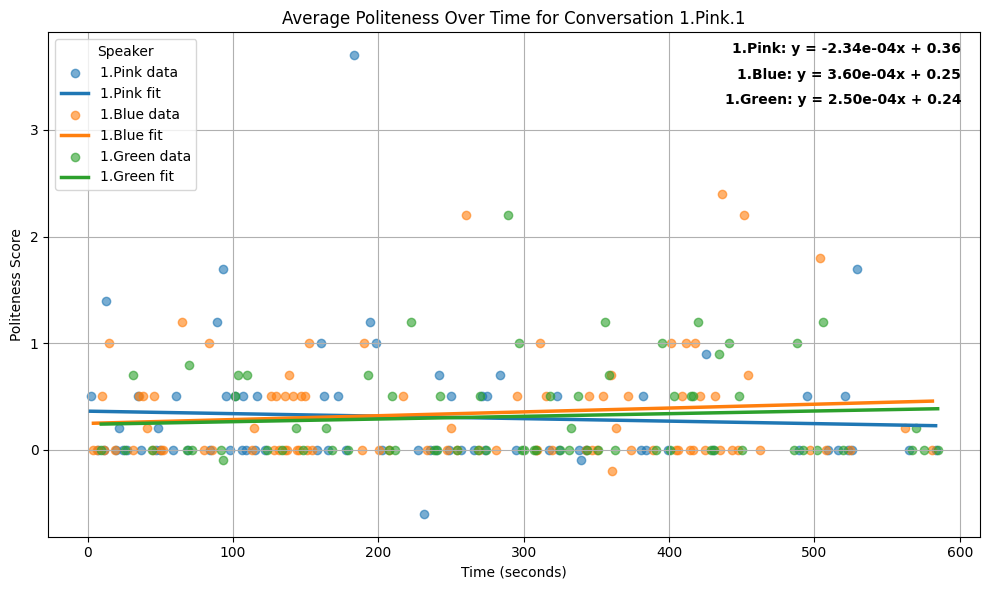

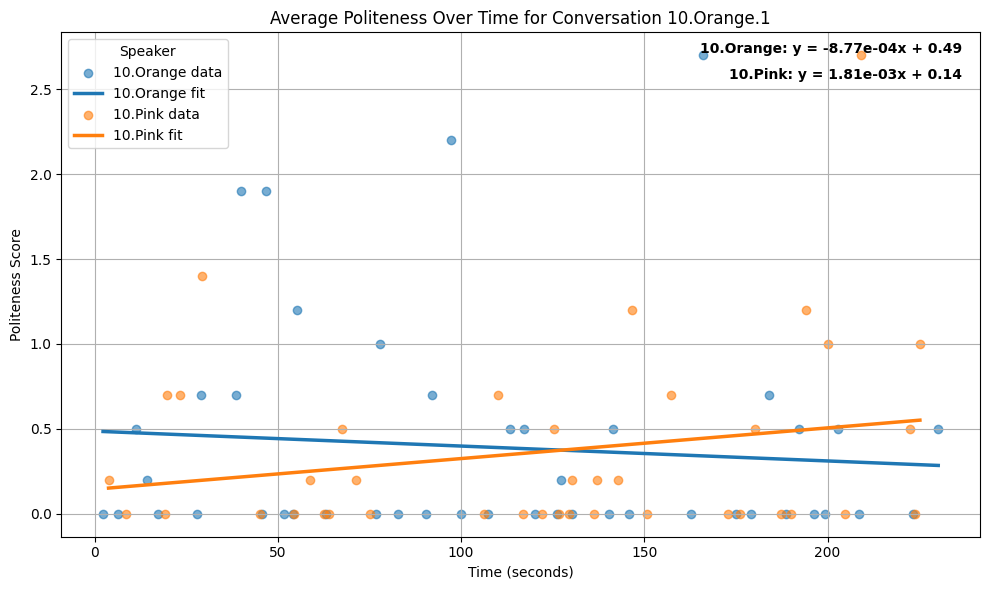

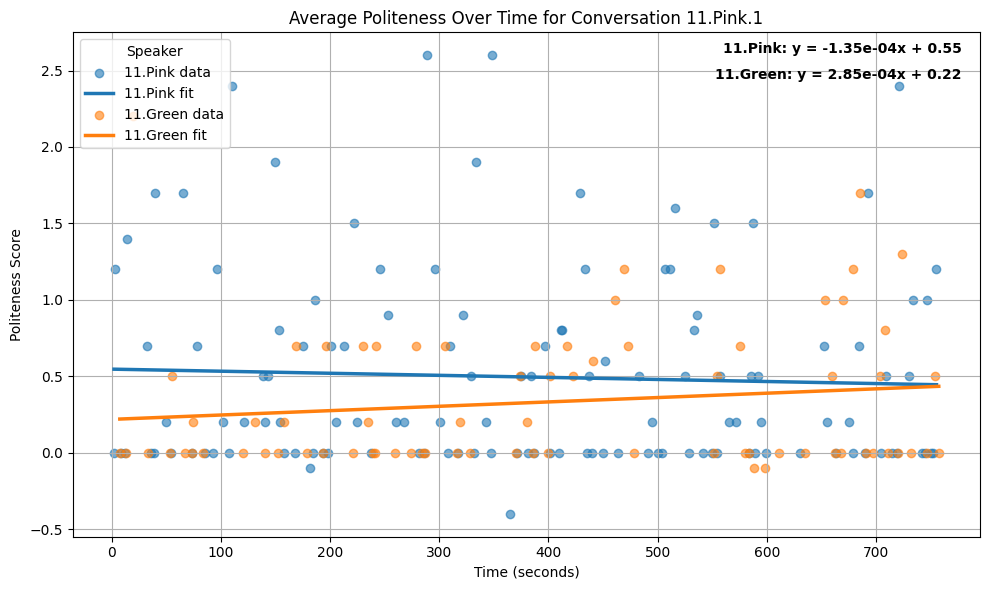

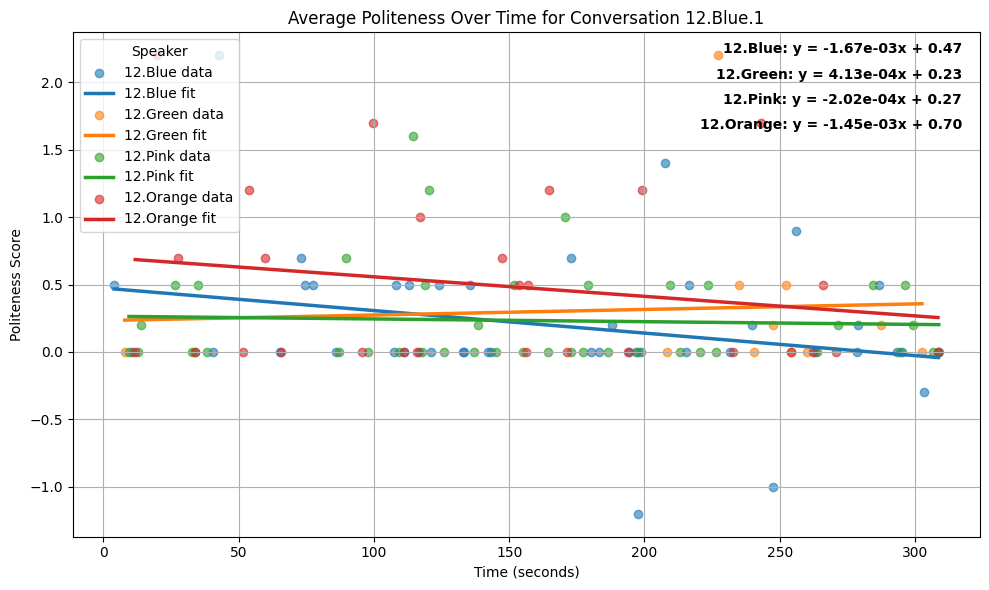

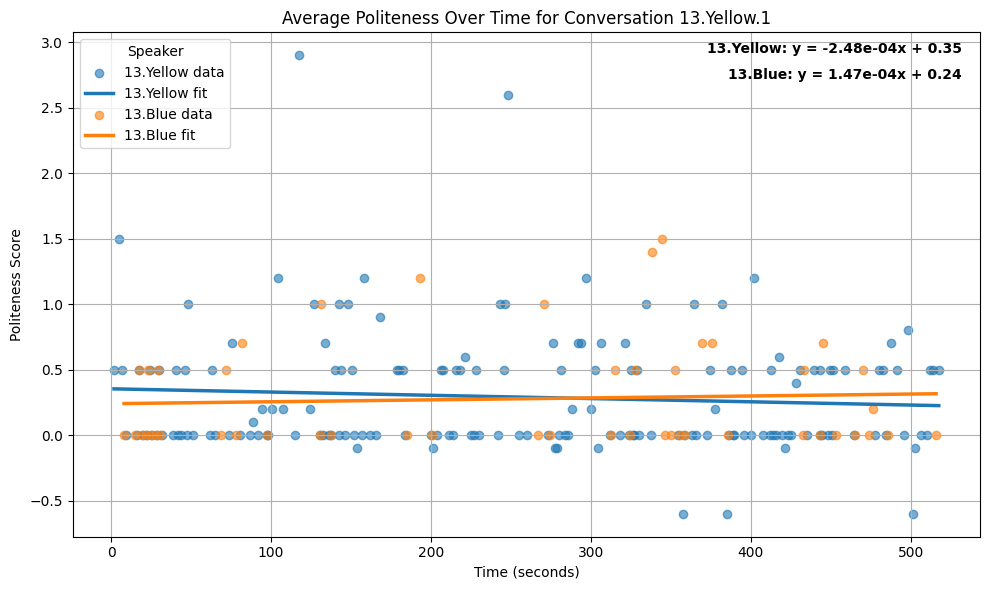

...

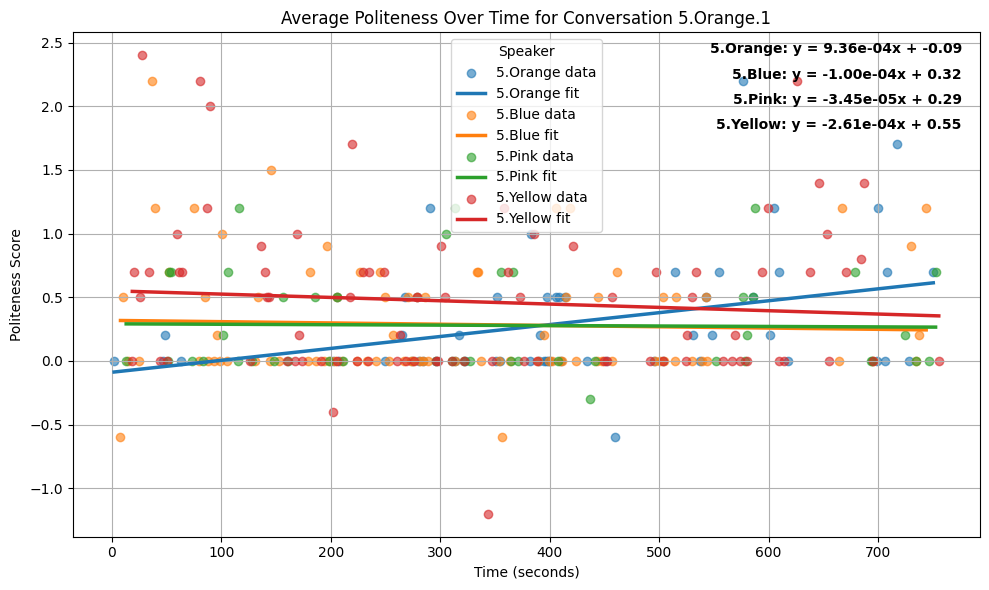

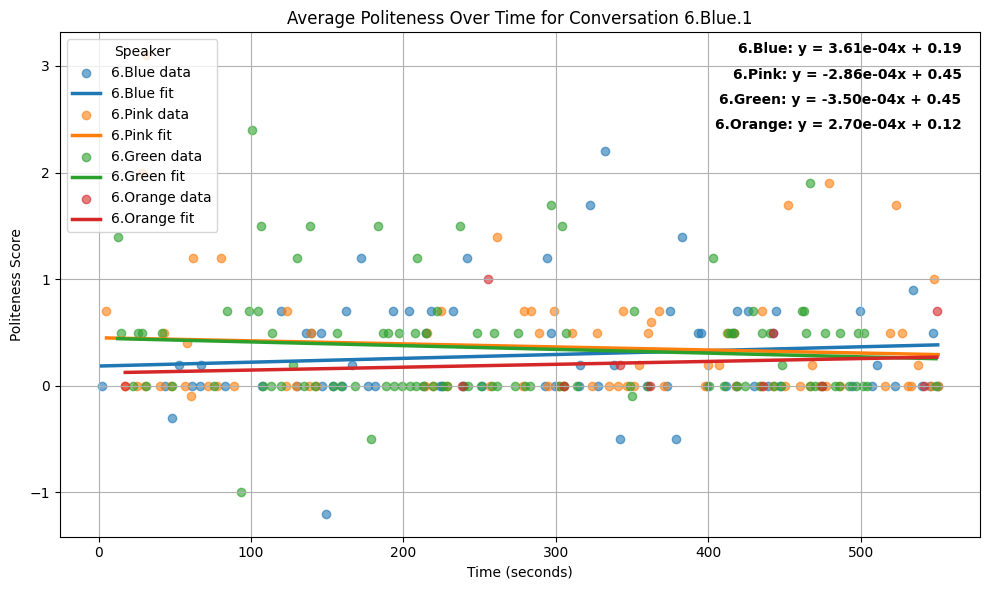

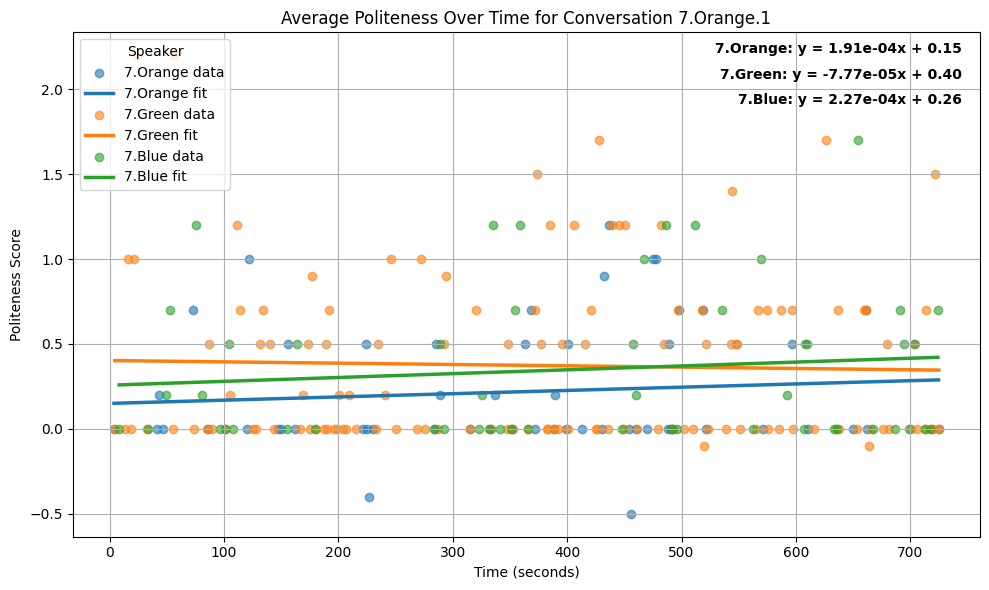

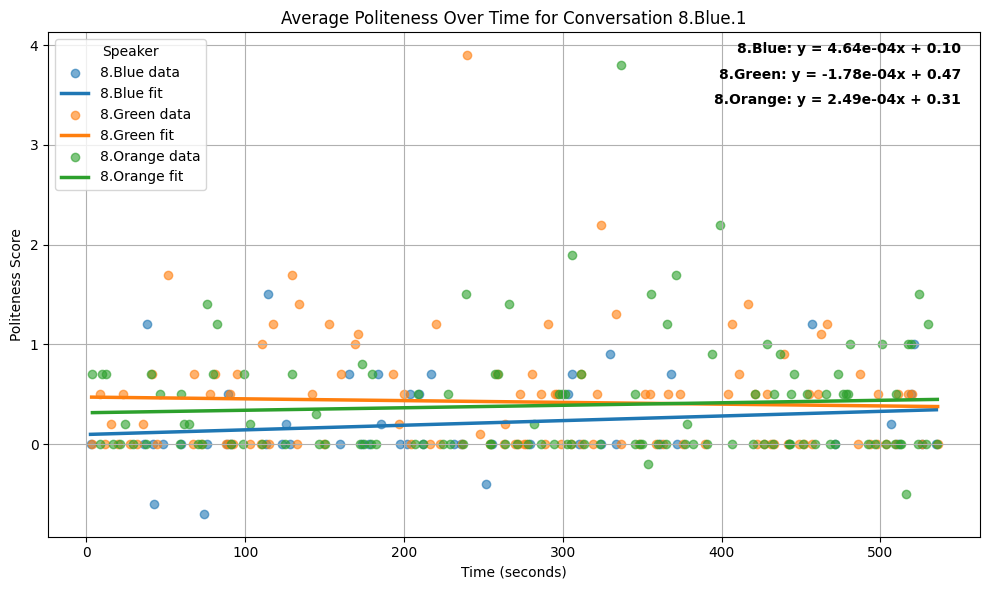

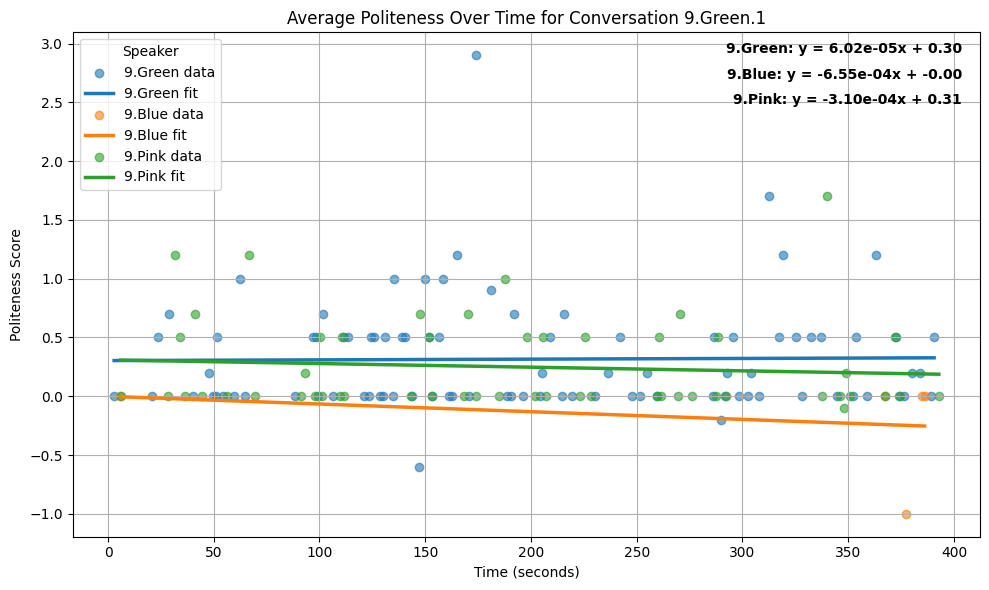

In [4]:
import matplotlib.pyplot as plt
import numpy as np
from convokit import Corpus, download


# Very similar to Block 3, but only fits linear regression.

gap_corpus = Corpus(filename=download("gap-corpus"))
print("Download complete!")

for conv_id, conversation in gap_corpus.conversations.items():
    speakers_data = {}
    
    for utterance in conversation.iter_utterances():
        if not utterance.timestamp or not hasattr(utterance, 'text') or not utterance.text:
            continue
        time_sec = timestamp_to_seconds(utterance.timestamp)
        if time_sec is None:
            continue
        speaker_id = utterance.speaker.id
        text = utterance.text.lower().strip()
        if text in ["$", "%", "#"]:
            continue
        
        utterance_politeness = 0.0
        for indicator, weight in politeness_indicators.items():
            count = text.count(indicator)
            if count:
                utterance_politeness += count * weight
        for indicator, weight in impoliteness_indicators.items():
            count = text.count(indicator)
            if count:
                utterance_politeness -= count * weight
        words = text.split()
        if len(words) > 10:
            utterance_politeness += 0.2
        
        speakers_data.setdefault(speaker_id, []).append((time_sec, utterance_politeness))
    
    plt.figure(figsize=(10, 6))
    plt.title(f"Average Politeness Over Time for Conversation {conv_id}")
    plt.xlabel("Time (seconds)")
    plt.ylabel("Politeness Score")
    
    equation_texts = [] 
    
    for speaker_id, data_points in speakers_data.items():
        data_points.sort(key=lambda x: x[0])
        cleaned_points = collapse_consecutive_zeros(data_points)
        times = np.array([pt[0] for pt in cleaned_points])
        scores = np.array([pt[1] for pt in cleaned_points])
        
        if len(times) < 2:
            continue  # Skip if not enough data
        
        # Fit a linear regression
        slope, intercept = np.polyfit(times, scores, 1)
        reg_x = np.linspace(times.min(), times.max(), 100)
        reg_y = slope * reg_x + intercept
        plt.scatter(times, scores, label=f"{speaker_id} data", alpha=0.6)
        plt.plot(reg_x, reg_y, linewidth=2.5, label=f"{speaker_id} fit")
        eq_text = f"{speaker_id}: y = {slope:.2e}x + {intercept:.2f}"
        equation_texts.append(eq_text)

    for i, eq in enumerate(equation_texts):
        plt.text(0.98, 0.98 - i * 0.05, eq,
                 transform=plt.gca().transAxes,
                 ha='right', va='top', fontweight='bold', fontsize=10)
    
    plt.legend(title="Speaker")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
